REAL ESTATE - BUENOS AIRES

En este trabajo se presentara informacion estadistica clave para entender el mercado de inmuebles en Buenos Aires, Argentina. Se buscara abordar cuestiones que pasan por la mente de un agente el cual busca optimizar el rendimiento de su capital adentrandose en el mundo del real estate.

Para entender este mercado es importante entender que compone el valor de una propiedad. Para esto surge preguntas como, que es lo que realmente altera el valor de las propiedades? Existe algo que por si solo pueda darle una gran variacion al precio de una propiedad? Que es y como encontrarlo? Este trabajo intentara abordar estas preguntas con una vision microeconomica y estadistica, pero me parece necesario resaltar que no estoy teniendo en cuenta una mirada historica y macroeconomica que sin lugar a duda hay tener en cuenta esto para realizar un analisis completo. La volatilidad en el precio del metro cuadrado en Argentina es muy grande a lo largo de periodos de tiempo no mayores a 20 años, es por esto que el fenomeno macroeconomico no debe dejarse de lado.

Habiendo echo esta aclaracion tambien es hay que darle importancia a los factores microeconomicos, son a su vez de suma importancia afectando significativamente el precio del metrocuadrado. Como dije, este trabajo presentara informacion y analisis estadisticos para ayudar al inversor a tomar una decicion optima. 

Usare un data set de Keaggle que recolecto los datos en el año 2019 a travez de una pagina de venta de propiedades llamada Properati (https://www.kaggle.com/datasets/alejandromendivil/bsas-realstate-on-sale).
Aclaracion sobre varaibles.
l1: Pais
zona: Zona
localidad: Barrio
start_date: fecha de alta del aviso de venta de propiedad.
end_date: fecha de baja del aviso de venta de propiedad.
created_on: fecha de alta de la primera versión del aviso.
lat: latitud de la ubicación geográfica de la propiedad.
lon: longitud de la ubicación geográfica de la propiedad.
rooms: número de habitaciones de la propiedad.
bedrooms: número de dormitorios de la propiedad.
bathrooms: número de baños de la propiedad.
surface_total: superficie total de la propiedad en metros cuadrados.
surface_covered: superficie cubierta de la propiedad en metros cuadrados.
price: precio de la propiedad en la moneda local.
currency: moneda local utilizada para el precio de la propiedad.
title: título de la oferta inmobiliaria que resume las características principales de la propiedad.
description: descripción detallada de la oferta inmobiliaria que incluye información adicional sobre la propiedad, el entorno, las condiciones de venta o alquiler, etc.
property_type: tipo de propiedad ofertada.
operation_type: tipo de operación inmobiliaria.

OBJETIVO

El objetivo final del trabajo es crear un modelo que intente predecir el valor de una propiedad conociendo los parametros de la misma. 

EDA

Cargamos la librerias.

In [175]:
import pandas as pd
import numpy as np
import random as rd 
import matplotlib.pyplot as plt
%matplotlib inline 
import seaborn as sns
import sklearn as sk
import statsmodels.stats.api as sms 
from scipy import stats
import statsmodels.api as sm
import altair as alt
import plotly as px

Cargando datos.

In [176]:
df = pd.read_csv("D:/Nico@ThisHost/OneDrive/Documentos/NICOLAS/Data Science fundamentos/DATA SETS/regresion/realstateBSAS.csv")

Limpieza

In [177]:
# Convertir las fechas a datetime y convertir los errores a NaT
df["start_date"] = pd.to_datetime(df["start_date"], format="%Y-%m-%d", errors="coerce")
df["end_date"] = pd.to_datetime(df["end_date"], format="%Y-%m-%d", errors="coerce")

# Limpiando valores repetidos
df.drop_duplicates(inplace=True)

# Cambiandole el nombre a columnas para mejorar legible.
df.rename(columns={'l2': 'zona', 'l3': 'localidad'}, inplace=True)


In [178]:
df.sample(5)

,start_date,end_date,created_on,lat,lon,l1,zona,localidad,rooms,bedrooms,bathrooms,surface_total,surface_covered,price,currency,title,description,property_type,operation_type
74136,2020-01-21,NaT,2020-01-21,-34.606382,-58.432037,Argentina,Capital Federal,Caballito,3.0,2.0,1.0,96.0,67.0,275000.0,USD,VENTA 3 AMB.CABALLITO TERRAZA PROP.COCHERA BA...,Corredor Responsable: Rebeca Stern - C.U.C.I.C...,Departamento,Venta
58828,2019-11-13,NaT,2019-11-13,-34.551873,-58.698860,Argentina,Bs.As. G.B.A. Zona Norte,San Miguel,2.0,1.0,1.0,NaN,NaN,125000.0,USD,"Departamento en Venta en Box (izquierdo), Mu?i...","\nVenta de Departamento 2 AMBIENTES en Box, Mu...",Departamento,Venta
91761,2019-01-17,2019-01-23,2019-01-17,-34.595905,-58.379983,Argentina,Capital Federal,Barrio Norte,5.0,3.0,3.0,133.0,133.0,395000.0,USD,EXCELENTE DEPARTAMENTO EN VENTA EN BARRIO NORTE,Impecable departamento de 133 m2 sobre Suipach...,Departamento,Venta
51251,2019-01-06,2019-02-28,2019-01-06,-34.595905,-58.395651,Argentina,Capital Federal,Barrio Norte,4.0,3.0,2.0,108.0,102.0,365000.0,USD,Venta Departamento / Oficina con cochera y bau...,Corredor Responsable: MARIANO AUFSEHER - CUCIC...,Departamento,Venta
69364,2019-08-24,2019-09-04,2019-08-24,-34.474987,-58.538583,Argentina,Bs.As. G.B.A. Zona Norte,San Isidro,5.0,4.0,3.0,166.0,114.0,307000.0,USD,Departamento,Lindisimo depto de 4 dormitoriosMartillero y C...,Departamento,Venta


Limpieza de registros con valores nulos.

In [179]:
df.isnull().sum()

start_date             0
end_date           25061
created_on             0
lat                 9572
lon                 9606
l1                     0
zona                   0
localidad              0
rooms                  0
bedrooms               0
bathrooms           5924
surface_total      20261
surface_covered    21339
price                  0
currency               0
title                  0
description            0
property_type          0
operation_type         0
dtype: int64

In [180]:
# Limpio localidades residenciales sin baños.
df = df[~((df['property_type'].isin(['Departamento', 'Casa', 'Casa de campo', 'PH'])) & (df['bathrooms'].isna()))]

# Dropeo los registros cuya superficie total sea nula.
df = df.dropna(subset=['surface_total'])

# Dropeo los registros cuya superficie cubierta sea nula.
df = df.dropna(subset=['surface_covered'])

# Dropeo registros donde no se espesifica el tipo de propiedad.
df = df[df.property_type != "Otro"]

Creando variables artificiales de utilidad.

pm2: Valor del metro cuadrado.

sold: porcentaje de propiedades vendidas.

In [181]:
# Precio metro cuadrado
df["pm2"] = df["price"] / df["surface_total"]

# Filtrar registros con fecha no nula en "end_date"
sales_filter = df[df["end_date"].notna()]

# Contar la cantidad de registros filtrados
sales = len(sales_filter)

# Crear una columna para indicar si la propiedad se vendió o no
df["sold"] = ~df["end_date"].isna()
df["sold"] = df["sold"].astype(float)

# Dropeo la variable currency ya que en la unica variable en la que se publica es en USD
df = df.drop(columns="currency")


Limpando registros sin sentido.

In [182]:
# Limipando valor atipico sin sentido en pm2.
df = df[df['pm2'] <= 25000]
df = df[df['pm2'] >= 400]
# Limipando valor atipico sin sentido en bathrooms.
df = df[df.bathrooms<8]
# Limipando valor atipico sin sentido en rooms.
df = df[df.rooms<15]
# Limipando valor atipico sin sentido en surface_total.
df = df[df.surface_total<2500]

In [183]:
df.pm2.describe()

count    115111.000000
mean       2462.831195
std        1202.867579
min         400.000000
25%        1750.000000
50%        2367.346939
75%        3000.000000
max       22916.666667
Name: pm2, dtype: float64

Estas son las variables que utilizare:


In [184]:
df.columns

Index(['start_date', 'end_date', 'created_on', 'lat', 'lon', 'l1', 'zona',
       'localidad', 'rooms', 'bedrooms', 'bathrooms', 'surface_total',
       'surface_covered', 'price', 'title', 'description', 'property_type',
       'operation_type', 'pm2', 'sold'],
      dtype='object')

ANALISIS DEL DATA SET

Empezemos analizando el precio. 

Histograma con el precio de las propiedades, como valor maximo 1.000.000 para poder ver un mejor grafico. De esta forma solo estamos perdiendo el 2% de nuestros datos.

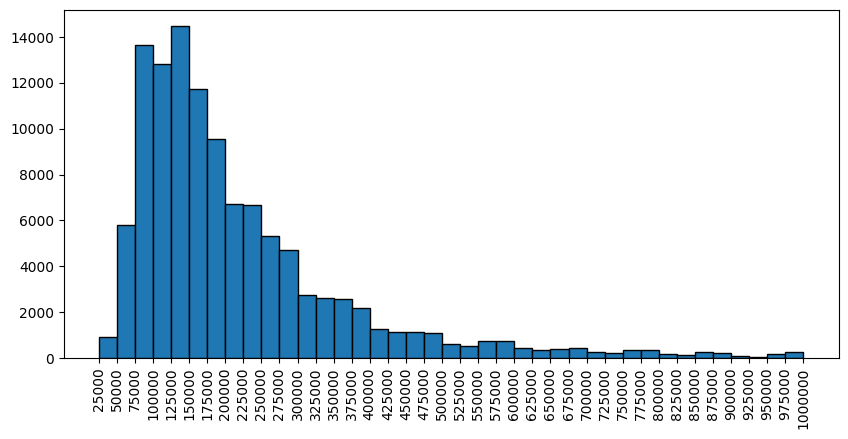

In [57]:
# Definir el valor inicial, el valor final y el paso
inicio = 25000
fin = 1000000
paso = 25000

# Generar la lista de números con la función range
bins = list(range(inicio, fin + paso, paso))

# Cambiar el tamaño del gráfico con la función figure
plt.figure(figsize=(10, 6))

# Generar el histograma con la función hist
plt.hist(df["price"], bins=bins, edgecolor="black")

# Añadir etiquetas al eje x con los intervalos y rotarlas 90 grados
plt.xticks(bins, [str(b) for b in bins], rotation=90)

# Aumentar el espacio entre los ejes con la función subplots_adjust
plt.subplots_adjust(bottom=0.3)

# Mostrar el gráfico
plt.show()


In [58]:
# Calcular el número total de registros
total = len(df)

# Filtrar los registros con un precio mayor a un millón
filtro = df["price"] > 1000000
mayores = df[filtro]

# Calcular el número de registros filtrados
n_mayores = len(mayores)

# Calcular el porcentaje de registros filtrados
porcentaje = (n_mayores / total) * 100

# Mostrar el porcentaje
print(f"El porcentaje de registros con un precio mayor a un millón es {porcentaje:.2f}%")

El porcentaje de registros con un precio mayor a un millón es 2.08%


Datos descriptivos para entender mejor la variable price.

In [59]:
df["price"].describe().apply(lambda x: round(x, 1))

count      116117.0
mean       245722.6
std        280694.1
min         12000.0
25%        116000.0
50%        170000.0
75%        270000.0
max      11111111.0
Name: price, dtype: float64

Antes de pasar al siguiente analisis, veamos la distribucion del precio del metro cuadrado.

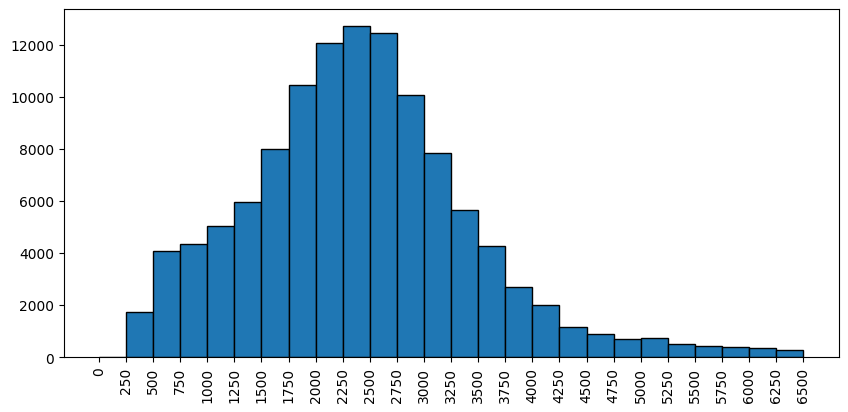

In [60]:
# Definir el valor inicial, el valor final y el paso
inicio = 0
fin = 6500
paso = 250

# Generar la lista de números con la función range
bins = list(range(inicio, fin + paso, paso))

# Cambiar el tamaño del gráfico con la función figure
plt.figure(figsize=(10, 6))

# Generar el histograma con la función hist
plt.hist(df["pm2"], bins=bins, edgecolor="black")

# Añadir etiquetas al eje x con los intervalos y rotarlas 90 grados
plt.xticks(bins, [str(b) for b in bins], rotation=90)

# Aumentar el espacio entre los ejes con la función subplots_adjust
plt.subplots_adjust(bottom=0.3)

# Mostrar el gráfico
plt.show()

In [61]:
df["pm2"].describe().apply(lambda x: round(x, 1))

count    116117.0
mean       2459.4
std        1202.7
min         400.0
25%        1745.0
50%        2363.6
75%        3000.0
max       22916.7
Name: pm2, dtype: float64

Histograma para ver en que fecha se venden mas propiedades.

<Axes: >

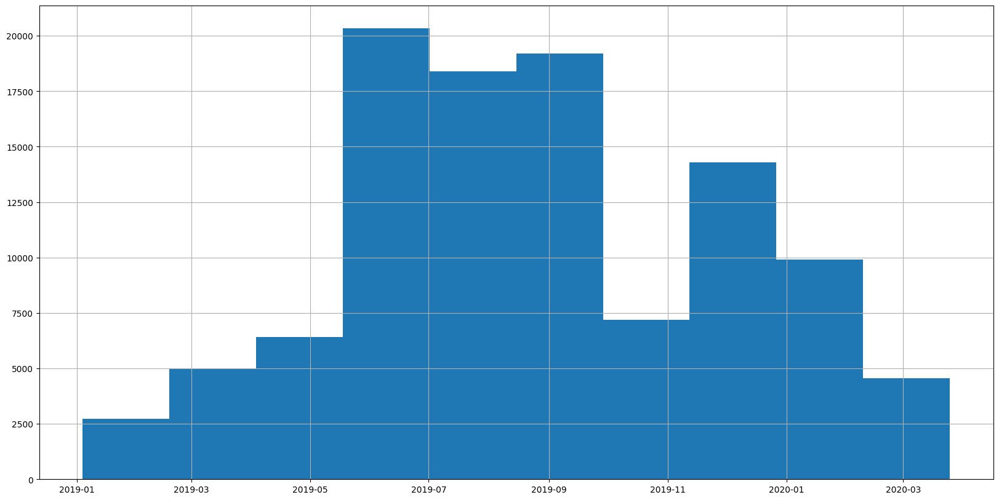

In [62]:
df["end_date"].hist(figsize=(20,10))

ANALISIS SEGUN EL TIPO DE PROPIEDAD

Con la siguiente tabla podemos ver las principales variables segun el tipo de propiedad.

In [63]:
# Agrupar por property_type y calcular la media de price
tabla = df.groupby("property_type").agg({"pm2": "mean","price": "mean","sold": "mean", "surface_total" : "mean"})

# Ordenar los datos por pm2 de forma descendente
df_sorted = tabla.sort_values("pm2", ascending=False)

# Restablecer el índice
df_sorted = df_sorted.reset_index()

# Mostrar las columnas deseadas
display(df_sorted[["property_type", "pm2", "price", "sold","surface_total"]])

,property_type,pm2,price,sold,surface_total
0,Departamento,2748.755480,245827.410622,0.940975,84.251420
1,Oficina,2324.166368,174402.397143,0.911429,85.102857
2,PH,1711.056371,189090.527043,0.926146,124.528145
3,Local comercial,1538.000616,192764.705882,0.470588,154.941176
4,Lote,1357.625314,410143.243243,0.911197,353.494208
5,Depósito,1276.955534,219000.000000,0.166667,355.833333
6,Cochera,1100.000000,15000.000000,0.500000,13.500000
7,Casa,1088.870735,311016.828449,0.849947,327.656458
8,Casa de campo,1045.147685,353777.777778,0.777778,478.222222


Grafico con el precio medio de las propiedades. (No representa el valor del metro cuadrado)

C:\Users\nicon\AppData\Local\Temp\ipykernel_10024\3129826673.py:2: FutureWarning: 

The `ci` parameter is deprecated. Use `errorbar=None` for the same effect.

  ax = sns.barplot(x = "property_type", y = "price", data = df, palette = "Blues_d", ci = None)
C:\Users\nicon\AppData\Local\Temp\ipykernel_10024\3129826673.py:2: FutureWarning: 

Passing `palette` without assigning `hue` is deprecated and will be removed in v0.14.0. Assign the `x` variable to `hue` and set `legend=False` for the same effect.

  ax = sns.barplot(x = "property_type", y = "price", data = df, palette = "Blues_d", ci = None)
C:\Users\nicon\AppData\Local\Temp\ipykernel_10024\3129826673.py:5: UserWarning: set_ticklabels() should only be used with a fixed number of ticks, i.e. after set_ticks() or using a FixedLocator.
  ax.set_xticklabels(ax.get_xticklabels(), rotation = 45)


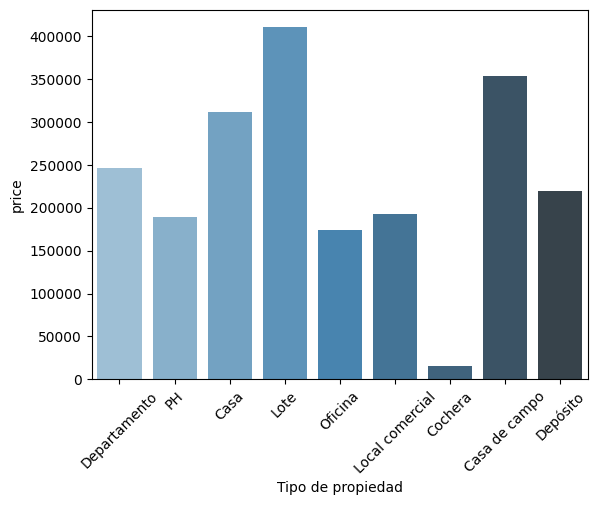

In [64]:
# Creo un gráfico de barras con los datos de df.
ax = sns.barplot(x = "property_type", y = "price", data = df, palette = "Blues_d", ci = None)

# Separar más los valores del eje x.
ax.set_xticklabels(ax.get_xticklabels(), rotation = 45)

# Cambiar la etiqueta del eje x.
ax.set(xlabel = "Tipo de propiedad")

# Mostrar el gráfico
plt.show()

ANALISIS DE UBICACION

ANALISIS SEGUN LA ZONA

Datos relevantes segun la zona de Buenos Aires.

Los datos estan expreados segun la media. Properties for sale, es la suma de propiedades en venta.

In [65]:
# Precio metro cuadrado
df["pm2"] = df["price"] / df["surface_total"]

# Filtrar registros con fecha no nula en "end_date"
sales_filter = df[df["end_date"].notna()]

# Contar la cantidad de registros filtrados
sales = len(sales_filter)


# Agrupar por la variable "zona" y calcular las estadísticas deseadas
df_grouped = df.groupby("zona").agg({"pm2": "mean","price": "mean","rooms": "mean","bathrooms": "mean","sold": "mean","surface_total" : "mean"})

# Renombrar la columna "zona" a "properties for sale"
df_grouped.rename(columns={"zona": "properties for sale"}, inplace=True)

# Ordenar los datos por pm2 de forma descendente
df_sorted = df_grouped.sort_values("pm2", ascending=False)

# Restablecer el índice
df_sorted = df_sorted.reset_index()


# Mostrar las columnas deseadas
display(df_sorted[["zona", "pm2", "price", "rooms", "bathrooms", "sold","surface_total"]])


,zona,pm2,price,rooms,bathrooms,sold,surface_total
0,Capital Federal,2760.633388,264562.270320,3.013254,1.551770,0.942758,95.564527
1,Bs.As. G.B.A. Zona Norte,2155.596297,243452.008953,3.128377,1.748010,0.912880,149.714084
2,Bs.As. G.B.A. Zona Oeste,1362.720307,145529.014837,3.214727,1.436461,0.872647,147.581399
3,Bs.As. G.B.A. Zona Sur,1327.092427,165183.940024,3.464978,1.500271,0.899643,168.279203


A partir de este cuadro podemos realizar varias concluciones. La primera y mas interesante a primera vista es que capital federal es la zona mas cara y con propiedades de menor tamaño con diferencia y zona norte la segunda con un buen margen respecto a zona sur y oeste. Tambien llama la atencion el porcentaje elevado de ventas que tiene capital federal y zona norte.

Cantidad de propiedades en venta segun la zona.

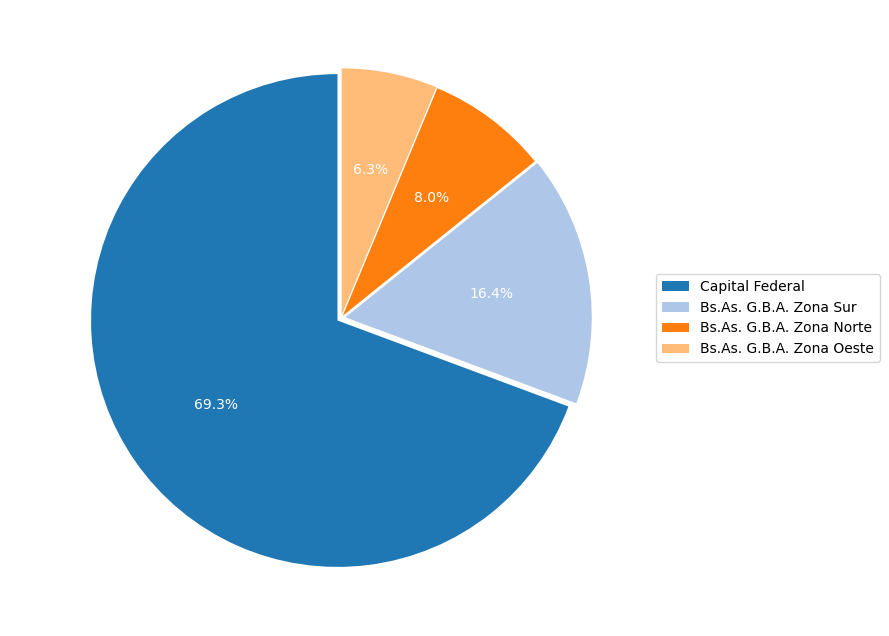

In [66]:
# Importar las bibliotecas matplotlib y random
import matplotlib.pyplot as plt
import random

# Crear una figura y un eje
fig, ax = plt.subplots(figsize=(10, 8))

# Obtener los nombres de los barrios
types = df["zona"].unique().tolist()

# Obtener los números de ventas por barrio
sales_num = df["zona"].value_counts().tolist()

# Obtener los colores de la paleta tab20
colors = plt.cm.tab20.colors

# Generar una lista de valores de separación
explode = [random.uniform(0.01, 0.02) for _ in range(len(types))]

# Dibujar el gráfico de torta con los valores, las etiquetas, los colores y los porcentajes
wedges, texts, autotexts = ax.pie(sales_num, explode=explode, labels=types, colors=colors, 
                                  autopct="%1.1f%%", startangle=90, textprops=dict(color="w"))

# Crear una leyenda para el gráfico
ax.legend(wedges, types, loc="center left", bbox_to_anchor=(1, 0, 0.5, 1))

# Mostrar el gráfico
plt.show()

ANALISIS SEGUN EL BARRIO

Mismo analisis para los barrios de Buenos Aires. Se creara un csv para poder ver todos los resultados, sin hacer una notebook excesivamente larga.

In [67]:
# Precio metro cuadrado
df["pm2"] = df["price"] / df["surface_total"]

# Filtrar registros con fecha no nula en "end_date"
sales_filter = df[df["end_date"].notna()]

# Contar la cantidad de registros filtrados
sales = len(sales_filter)

# Agrupar por la variable "localidad" y calcular las estadísticas deseadas
df_grouped = df.groupby("localidad").agg({
    "pm2": "mean",
    "price": "mean",
    "rooms": "mean",
    "bathrooms": "mean",
    "sold": "mean",  # Calcula la proporción de propiedades vendidas
    "localidad": "size"  # Cuenta el total de propiedades en cada grupo
})

# Renombrar la columna "localidad" a "properties for sale"
df_grouped.rename(columns={"localidad": "properties for sale"}, inplace=True)

# Ordenar los datos por pm2 de forma descendente
df_sorted = df_grouped.sort_values("pm2", ascending=False)

# Restablecer el índice
df_sorted = df_sorted.reset_index()

# Mostrar las columnas deseadas
display(df_sorted[["localidad", "pm2", "price", "rooms", "bathrooms", "sold", "properties for sale"]])
df_sorted.to_csv("datos_inmobiliarios.csv", index=False)

,localidad,pm2,price,rooms,bathrooms,sold,properties for sale
0,Puerto Madero,6064.023132,959895.860828,3.040192,2.682064,0.955609,1667
1,Las Cañitas,3853.137883,467046.967883,3.210219,2.271533,0.985401,685
2,Palermo,3468.701015,354912.947981,2.969752,1.614426,0.962772,12034
3,Belgrano,3368.238838,376533.504025,3.157665,1.865985,0.936095,5962
4,Recoleta,3344.615620,422190.635648,3.509068,1.818282,0.952006,5459
...,...,...,...,...,...,...,...
84,Almirante Brown,999.683851,221901.020202,4.065657,1.671717,0.858586,198
85,Merlo,899.877751,143319.318182,3.897727,1.607955,0.846591,176
86,Malvinas Argentinas,885.166344,191432.217391,4.229814,1.906832,0.906832,161
87,Villa Soldati,851.132961,124374.603175,3.968254,1.396825,0.857143,63


MAPA DE CALOR INTERACTIVO

Veamos un mapa de calor interactivo, destacando las zonas con precios mas caros. Aclaracion, el grafico no se visualiza en github, por lo que es necesario correrlo por fuera.

In [21]:
import plotly_express as px

df2 = df.dropna(subset=["lat", "lon"])
df2 = df.drop_duplicates(subset=["lat", "lon"])
df2 = df.groupby(["lat", "lon"])["pm2"].mean().reset_index()

fig = px.density_mapbox(df, lat="lat", lon="lon", z="pm2", radius=20, center=dict(lat=df2.lat.mean(),
                        lon=df2.lon.mean()), zoom=10, mapbox_style="open-street-map", height=900, color_continuous_scale="Viridis")

fig.show()

ANALISIS DE LA DEMANDA

Mostrando los 10 barrios con mas porcentaje de ventas sobre publicaciones, de esta forma podremos encontrar cuales son los barrios que tienen una demanda creciente.

In [22]:
# Calcular el valor del percentil 25 (Q1) para la variable "sold"
Q1 = df_sorted["sold"].quantile(0.89)

# Filtrar los datos para incluir solo registros con "sold" por encima del 25%
df_filtered = df_sorted[df_sorted["sold"] > Q1]

# Crear una tabla con los barrios (localidad), el precio del pm2 y la variable "sold"
top_sold = df_filtered[["localidad", "pm2", "sold"]]
top_sold = top_sold.sort_values(by="sold", ascending=False)

# Mostrar la tabla
display(top_sold)



,l3,pm2,sold
15,Parque Centenario,2433.588796,0.979430
6,Barrio Norte,3088.828020,0.952786
0,Puerto Madero,6056.145091,0.946344
32,Paternal,2078.743552,0.933908
18,Abasto,2403.633569,0.931416
2,Palermo,3466.463593,0.927634
46,Once,1942.870726,0.927203
34,Tribunales,2067.804554,0.922652
19,Almagro,2403.469106,0.920312
16,Villa Crespo,2429.915853,0.918117


EDA PARA MACHINE LEARNING.

Trabajare con regresiones para analizar la causalidad de mis parametros.

Eliminamos los registros que no sean residenciales para no confundir las estimaciones de nuestra regresion multiple.

In [185]:
# Crear una lista con los valores que quieres eliminar
valores_a_eliminar = ["Local comercial", "Otro", "Cochera", "Depósito", "Lote"]

# Filtrar las filas que no tienen esos valores en la columna property_type
filtro = ~df["property_type"].isin(valores_a_eliminar)

# Crear un nuevo DataFrame con las filas filtradas
df_residencial = df[filtro]

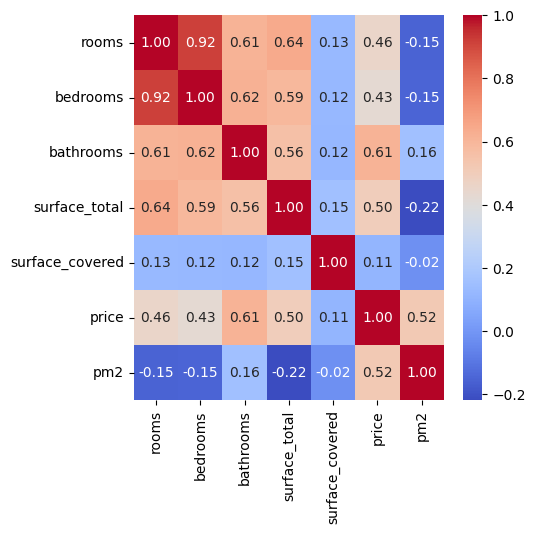

In [186]:
# Creando df con variables numéricas de interés.
df_numeric_residencial = df_residencial.select_dtypes(include=["int64", "float64"])
df_numeric_residencial = df_numeric_residencial.drop(columns=["lon", "lat", "sold"]) # elimina las variables que no quieres usar

# Calculando la matriz de correlación
corr = df_numeric_residencial.corr()

# Creando un mapa de calor con la matriz de correlación
plt.figure(figsize=(5, 5))
sns.heatmap(corr, annot=True, fmt=".2f", cmap="coolwarm")
plt.show()

Viendo este mapa de correlacion podemos llegar a la conclucion de que bedrooms y bathrooms deberian ser dropeadas.

Regresion sobre el precio del metro cuadrado.

In [187]:
# Limpieza de datos
df_numeric_residencial = df_numeric_residencial.dropna()
df_numeric_residencial = df_numeric_residencial.dropna(subset=["pm2"])
df_num = df_numeric_residencial.drop(columns=["bedrooms","rooms"]) # elimina las variables que no quieres usar

# creando variables para la regresion
y = df_num["pm2"]
X = df_num.drop("pm2", axis=1)

# regresion 
X_constant = sm.add_constant(X)
lin_reg = sm.OLS(y,X_constant).fit()
lin_reg.summary()

<class 'statsmodels.iolib.summary.Summary'>
"""
                            OLS Regression Results                            
==============================================================================
Dep. Variable:                    pm2   R-squared:                       0.574
Model:                            OLS   Adj. R-squared:                  0.574
Method:                 Least Squares   F-statistic:                 3.878e+04
Date:                Wed, 20 Mar 2024   Prob (F-statistic):               0.00
Time:                        15:32:49   Log-Likelihood:            -9.3030e+05
No. Observations:              115071   AIC:                         1.861e+06
Df Residuals:                  115066   BIC:                         1.861e+06
Df Model:                           4                                         
Covariance Type:            nonrobust                                         
===================================================================================
                      coef    std err          t      P>|t|      [0.025      0.975]
-----------------------------------------------------------------------------------
const            2284.9457      4.948    461.801      0.000    2275.248    2294.643
bathrooms           1.8206      3.740      0.487      0.626      -5.509       9.150
surface_total      -6.2328      0.024   -263.529      0.000      -6.279      -6.186
surface_covered    -0.0392      0.005     -7.478      0.000      -0.049      -0.029
price               0.0036   1.08e-05    333.652      0.000       0.004       0.004
==============================================================================
Omnibus:                    64785.938   Durbin-Watson:                   1.365
Prob(Omnibus):                  0.000   Jarque-Bera (JB):          7099702.063
Skew:                           1.779   Prob(JB):                         0.00
Kurtosis:                      41.316   Cond. No.                     9.37e+05
==============================================================================

Notes:
[1] Standard Errors assume that the covariance matrix of the errors is correctly specified.
[2] The condition number is large, 9.37e+05. This might indicate that there are
strong multicollinearity or other numerical problems.
"""

Regresion sobre el valor de la propiedad.

In [188]:
# Limpieza de datos
df_numeric_residencial = df_numeric_residencial.drop(columns=["bedrooms"])

# creando variables para la regresion
y = df_numeric_residencial["price"]
X = df_numeric_residencial.drop("price", axis=1)
# regresion 
X_constant = sm.add_constant(X)
lin_reg = sm.OLS(y,X_constant).fit()
lin_reg.summary()

<class 'statsmodels.iolib.summary.Summary'>
"""
                            OLS Regression Results                            
==============================================================================
Dep. Variable:                  price   R-squared:                       0.715
Model:                            OLS   Adj. R-squared:                  0.715
Method:                 Least Squares   F-statistic:                 5.776e+04
Date:                Wed, 20 Mar 2024   Prob (F-statistic):               0.00
Time:                        15:32:49   Log-Likelihood:            -1.5344e+06
No. Observations:              115071   AIC:                         3.069e+06
Df Residuals:                  115065   BIC:                         3.069e+06
Df Model:                           5                                         
Covariance Type:            nonrobust                                         
===================================================================================
                      coef    std err          t      P>|t|      [0.025      0.975]
-----------------------------------------------------------------------------------
const           -4.177e+05   1553.960   -268.796      0.000   -4.21e+05   -4.15e+05
rooms            3.639e+04    479.911     75.823      0.000    3.54e+04    3.73e+04
bathrooms         5.73e+04    746.683     76.743      0.000    5.58e+04    5.88e+04
surface_total     968.2743      5.096    190.022      0.000     958.287     978.262
surface_covered     8.5078      0.999      8.516      0.000       6.550      10.466
pm2               142.6496      0.408    350.004      0.000     141.851     143.448
==============================================================================
Omnibus:                   151524.522   Durbin-Watson:                   1.578
Prob(Omnibus):                  0.000   Jarque-Bera (JB):        166217025.006
Skew:                           6.802   Prob(JB):                         0.00
Kurtosis:                     188.694   Cond. No.                     9.85e+03
==============================================================================

Notes:
[1] Standard Errors assume that the covariance matrix of the errors is correctly specified.
[2] The condition number is large, 9.85e+03. This might indicate that there are
strong multicollinearity or other numerical problems.
"""

El coeficiente de Durbin-Watson puede variar entre en 0 y 4, si el valor es cercano a 2 significa que no hay autocorrelacion entre los residuos. si es menor a 2 hay correlacion positiva, y si es mayor lo contrario. Un error positivo en un período se asocia con un error positivo en el período siguiente, y lo mismo ocurre con los errores negativos1. Esto implica que el modelo no capta toda la información de los datos y que hay una dependencia temporal entre las observaciones. Evalueamos la homocedasticidad.

El modelo pasa por la prueba de homocedasticidad, aunque no es perfecto.

In [189]:
from scipy import stats

# probando homocedasticidad
stats.shapiro(lin_reg.resid) 

# El valor deberia estar cercano a 1  para indicar que los resiuduos tienen una distribucion normal

C:\Users\nicon\AppData\Local\Temp\ipykernel_16500\232035455.py:4: UserWarning: scipy.stats.shapiro: For N > 5000, computed p-value may not be accurate. Current N is 115071.
  stats.shapiro(lin_reg.resid)


ShapiroResult(statistic=0.6127882296633264, pvalue=3.5658897735232746e-156)

No paso esta prueba de homocedasticidad, teniendo mayores residuos para valores altos en las variables independientes. Para que el modelo tenga homocedasticidad el pvalue debe ser menor a 0.05, lo cual no se cumple y no hay homocedasticidad. La heterocedasticidad genera sesgos y aumenta la bondad del modelo(R2).

In [190]:
bp_test= sms.het_breuschpagan(resid_val,lin_reg.model.exog)
print(bp_test)
print("Breush-Pagan test: pvalue =" ,bp_test[1])

(11595.758569414424, 0.0, 2578.9086188017995, 0.0)
Breush-Pagan test: pvalue = 0.0


Con esta prueba podemos ver que las valores que estamos usando no tienen un alto nivel de multicolinealidad entre si. Por lo que los errores de homocedasticidad se pueden deber a la falta de variables que expliquen el fenomeno.

In [191]:
#multicolLinearity
from statsmodels.stats.outliers_influence import variance_inflation_factor

vif = [variance_inflation_factor(X_constant.values, i) for i in range(X_constant.shape[1])]
pd.DataFrame({"vif": vif[1:]}, index=X.columns).T

# Hay que sacar variables que tengan una correlacion mayor a 5, se puede permitir un valor hasta de 10.

,rooms,bathrooms,surface_total,surface_covered,pm2
vif,2.09,2.046944,1.993729,1.026262,1.235401


El modelo esta sesgado ya que deberia darnos un valor cercano a cero. Este metodo nos devuelve la media de los errores.

In [192]:
resid_val = lin_reg.resid
fitted_val = lin_reg.predict()
lin_reg.resid.mean()

-1.016753904564911e-08

Conclusion el modelo no es capaz de predecir adecuademente los resultados y no pasa toda las pruebas de robustes, aunque otras si. Se podria tratar de agregar nuevas variables lo que aumentaria el R^2 pero el modelo perderia confianza en los resultados.

MODELO PREDICTIVO DEL PRECIO CON REGRESION LINEAL.

Agregando variables dummies. Decidi trabajar con one hot encoder.

In [193]:
# creando variables dummies para cada registro segun al barrio al que pertenece.
dummies = pd.get_dummies(df.localidad)
dummies = dummies.replace({True: 1, False: 0})

# Creando variables dummies para cada registro segun el tipo de propiedad que es.
dummies1= pd.get_dummies(df.property_type)
dummies1 = dummies1.replace({True: 1, False: 0})

In [214]:
# Creando df con valores numericos.
df_numeric = df.select_dtypes(include=["int64", "float64"])
df_numeric = df_numeric.drop(columns=["lon","lat","bedrooms","sold","surface_covered"])

# uniendo las variables dummies al data frame
df2 = pd.concat([df_numeric,dummies],axis="columns")
df1 = pd.concat([df2,dummies1],axis="columns")

In [215]:
# Creando variables X e y.
X = df1.drop("price",axis="columns")
y = df1.price

In [216]:
# Creando grupo de entrenamiento.
from sklearn.model_selection import train_test_split
X_train, X_test, y_train, y_test = train_test_split(X, y, test_size=0.2, random_state=10)
train_df = X_train.join(y_train)

In [217]:
# Prueba de distribucion, gracias por el regalo muy util
from scipy.stats import ks_2samp

columnas_numericas_datos = X.select_dtypes(include="number").columns
columnas_numericas_muestra = X_train.select_dtypes(include = "number").columns

for columna_datos, columna_muestra in zip(columnas_numericas_datos,columnas_numericas_muestra):
    stadistic, p_value = ks_2samp(X[columna_datos], X_train[columna_muestra])
    print(f"columna: {columna_datos}")
    print(f"Estadistico: {stadistic}") # cuanto mas chico mejor
    print(f"P-valor: {p_value}")    # El p valor tiene que ser mayor a 0,05 para pasar la prueba de que son distintos.
    print(f"------------------------------------")

columna: rooms
Estadistico: 0.0008084827062718736
P-valor: 0.9999999999999982
------------------------------------
columna: bathrooms
Estadistico: 0.0007874997979027132
P-valor: 0.9999999999999998
------------------------------------
columna: surface_total
Estadistico: 0.0008406161985172744
P-valor: 0.9999999999999742
------------------------------------
columna: pm2
Estadistico: 0.0008081534716042338
P-valor: 0.9999999999999983
------------------------------------
columna: Abasto
Estadistico: 8.71745477859509e-06
P-valor: 1.0
------------------------------------
columna: Agronomía
Estadistico: 1.087087591344904e-05
P-valor: 1.0
------------------------------------
columna: Almagro
Estadistico: 0.00040663566273047014
P-valor: 1.0
------------------------------------
columna: Almirante Brown
Estadistico: 0.00010426305341737496
P-valor: 1.0
------------------------------------
columna: Avellaneda
Estadistico: 0.00015628062153627553
P-valor: 1.0
------------------------------------
column

In [218]:
from sklearn.preprocessing  import StandardScaler

# Normalizar los datos X
scaler = StandardScaler()
X_train_scaled = scaler.fit_transform(X_train)
X_test_scaled = scaler.transform(X_test)

In [219]:
from sklearn.linear_model import LinearRegression

# Entrenar el modelo con los datos normalizados
reg = LinearRegression()
reg.fit(X_train_scaled, y_train)

# Mostramos el score del modelo.
reg.score(X_test_scaled,y_test)

0.7347423769149846

In [220]:
from sklearn.model_selection import ShuffleSplit
from sklearn.model_selection import cross_val_score

# Hacemos varios testeos de nuestro modelo para evaluar su score.
cv = ShuffleSplit(n_splits=5, test_size=0.2, random_state=0)

cross_val_score(LinearRegression(), X, y, cv=cv)

array([0.73493616, 0.74005292, 0.72374102, 0.71231937, 0.71870304])

In [229]:
def predict_price(localidad, property_type, rooms, bathrooms, surface_total, surface_covered):
    # Verifica que surface_total sea mayor que surface_covered
    if surface_total < surface_covered:
        return "Error: superficie total debe ser mayor que superficie cubierta."

    # Encuentra el índice de la columna correspondiente a la localidad y tipo de propiedad
    loc_index = np.where(X.columns == localidad)[0][0]
    prop_index = np.where(X.columns == property_type)[0][0]

    # Crea un arreglo de ceros con la misma longitud que el número de columnas en X
    x = np.zeros(len(X.columns))
    # Asigna el número de habitaciones, baños y superficie total a las primeras tres posiciones
    x[0] = rooms
    x[1] = bathrooms
    x[2] = surface_total
    x[3] = surface_covered

    # Si los índices son válidos, establece el valor de la columna correspondiente a 1
    if loc_index >= 0:
        x[loc_index] = 1
    if prop_index >= 0:
        x[prop_index] = 1

    # Normaliza los datos de entrada usando el objeto 'scaler'
    x_scaled = scaler.transform([x])

    # Realiza la predicción con el modelo 'reg' y toma el primer valor
    precio = reg.predict(x_scaled)[0]
    precio_ajustado = precio * 1.5
    
    # Asegura que el precio sea un valor absoluto (positivo)
    precio_pos = abs(precio_ajustado)

    # Devuelve el precio positivo
    return precio_pos

A la funcion hay que darle estas variables en este orden: Localidad, tipo de propiedad, cant. cuartos, cant. baños, superficie total, superfice cubierta.

In [233]:
predict_price("Palermo","Departamento",6,3,230,200)

C:\Users\nicon\AppData\Local\Packages\PythonSoftwareFoundation.Python.3.12_qbz5n2kfra8p0\LocalCache\local-packages\Python312\site-packages\sklearn\base.py:493: UserWarning: X does not have valid feature names, but StandardScaler was fitted with feature names
  warnings.warn(


324327.30304235005

In [144]:
predict_price("Hurlingham","PH",3,2,220,320)

'Error: superficie total debe ser mayor que superficie cubierta.'

TODAS LAS LOCALIDADES.

In [200]:
df['localidad'].unique()

array(['San Cristobal', 'Boedo', 'Palermo', 'La Plata', 'Villa Crespo',
       'Parque Patricios', 'Villa Pueyrredón', 'Pilar', 'Tigre', 'Abasto',
       'Flores', 'Nuñez', 'Almagro', 'Belgrano', 'Floresta', 'Recoleta',
       'Caballito', 'Chacarita', 'San Telmo', 'Colegiales', 'La Matanza',
       'San Isidro', 'San Miguel', 'Villa Luro', 'Barrio Norte',
       'Las Cañitas', 'San Nicolás', 'Villa Urquiza', 'Vicente López',
       'Parque Centenario', 'Villa General Mitre', 'Lanús', 'Boca',
       'Once', 'Morón', 'Retiro', 'Monserrat', 'Avellaneda',
       'Puerto Madero', 'Villa Ortuzar', 'General San Martín',
       'Centro / Microcentro', 'Liniers', 'Balvanera', 'Coghlan',
       'Paternal', 'Saavedra', 'Parque Chacabuco', 'Villa Santa Rita',
       'Villa Lugano', 'Constitución', 'Mataderos', 'Villa Devoto',
       'Parque Avellaneda', 'Villa del Parque', 'Esteban Echeverría',
       'Lomas de Zamora', 'Almirante Brown', 'Ezeiza', 'San Vicente',
       'Berazategui', 'Quilmes', 

El modelo no es bueno para predecir valores atipicos ya que la regresion lineal no paso las pruebas de homocedasticidad aun asi tiene un buen funcionamiento para valores cercanos a la media.